In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
os.chdir('/data/lola/shockle/data_for_paper_attempt2/no_pymc')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_5chain_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 5):
        traces[trace].append(np.load('earm_dreamzs_5chain_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_5chain_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 5):
        logps[trace].append(np.load('earm_dreamzs_5chain_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-1088414.84442895]
 [-1038041.15582844]
 [-1038041.15582844]
 ..., 
 [   -4953.08545873]
 [   -4953.08545873]
 [   -4953.08545873]]
Logp of trace:  a  chain:  1  =  [-4880.02744053]
Logp of trace:  a  chain:  2  =  [-4956.03652284]
Logp of trace:  a  chain:  3  =  [-5005.58996233]
Logp of trace:  a  chain:  4  =  [-4924.89804512]
Logp of trace:  b  chain: 0 =  [[-1038126.36204948]
 [-1038126.36204948]
 [-1038126.36204948]
 ..., 
 [   -4930.77229699]
 [   -4930.77229699]
 [   -4930.77229699]]
Logp of trace:  b  chain:  1  =  [-4957.20649651]
Logp of trace:  b  chain:  2  =  [-5001.97665965]
Logp of trace:  b  chain:  3  =  [-5006.27367217]
Logp of trace:  b  chain:  4  =  [-4999.40108439]
Logp of trace:  c  chain: 0 =  [[-789274.10413485]
 [-789272.46791461]
 [-789272.49348936]
 ..., 
 [  -4960.87688592]
 [  -4960.87688592]
 [  -4960.87688592]]
Logp of trace:  c  chain:  1  =  [-4987.21689956]
Logp of trace:  c  chain:  2  =  [-4922.92063675]
Logp of tra

In [6]:
from earm_exp_parameters import earm_rates
uni_idx = []
norm_idx = []
uni_n = 0
norm_n = 0
for i, param in enumerate(model.parameters_rules()):
    if earm_rates[param.name]['type'] == 'uniform':
        uni_idx.append(i)
        uni_n += 1
    elif earm_rates[param.name]['type'] == 'normal':
        norm_idx.append(i)
        norm_n += 1

kf mito:  -14.8452186131  -  0.154781386928
kr mito:  -4.15478138693  -  13.8452186131
kf cyto:  -16.0001205731  -  -1.00012057306
kr cyto:  -2.99987942694  -  15.0001205731


In [7]:
traces['b'][0][:,72]

array([-9.11251272, -9.11251272, -9.11251272, ..., -7.65791764,
       -7.65791764, -7.65791764])

In [8]:
traces['a'][0][:,72]

array([ -8.87264852, -12.23316744, -12.23316744, ...,  -7.34816412,
        -7.34816412,  -7.34816412])

In [9]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    uni_param_n = 0
    norm_param_n = uni_n
    for i, param in enumerate(model.parameters_rules()):
        if i in uni_idx:
            param_trace_dict_a[param.name] = [traces[run][chain][:,uni_param_n] for chain in range(len(traces[run]))]
            uni_param_n += 1
        else:
            param_trace_dict_a[param.name] = [traces[run][chain][:,norm_param_n] for chain in range(len(traces[run]))]
            norm_param_n += 1
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [10]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  86  of  105  parameters.
Percent of parameters with GR below 1.2:  81.9047619048
Number of parameters with GR below 1.1:  62  of  105  parameters.
Percent of parameters with GR below 1.1:  59.0476190476


[86, 81.9047619047619, 62, 59.04761904761905]

In [11]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  95  of  105  parameters.
Percent of parameters with GR below 1.2:  90.4761904762
Number of parameters with GR below 1.1:  91  of  105  parameters.
Percent of parameters with GR below 1.1:  86.6666666667


[95, 90.47619047619048, 91, 86.66666666666667]

In [12]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  89  of  105  parameters.
Percent of parameters with GR below 1.2:  84.7619047619
Number of parameters with GR below 1.1:  75  of  105  parameters.
Percent of parameters with GR below 1.1:  71.4285714286


[89, 84.76190476190476, 75, 71.42857142857143]

In [13]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  88  of  105  parameters.
Percent of parameters with GR below 1.2:  83.8095238095
Number of parameters with GR below 1.1:  58  of  105  parameters.
Percent of parameters with GR below 1.1:  55.2380952381


[88, 83.80952380952381, 58, 55.23809523809524]

In [14]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-8.01554475, -8.01554475, -7.94539106, ..., -7.56587934,
        -7.56587934, -7.56587934]),
 array([-7.31684158, -6.92730776, -6.92730776, ..., -7.51909458,
        -7.51909458, -7.51909458]),
 array([-7.09055517, -7.14582403, -7.14582403, ..., -9.25928627,
        -9.25928627, -9.25928627]),
 array([-7.23366562, -7.23366562, -7.23366562, ..., -8.71795417,
        -8.71795417, -8.71795417]),
 array([-7.09055517, -7.09055517, -7.09055517, ..., -8.60445306,
        -8.60445306, -8.60445306])]

60000
5
60000


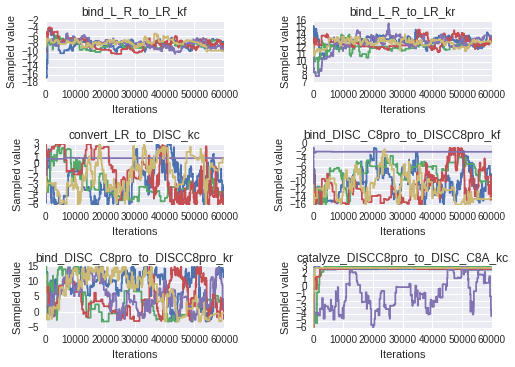

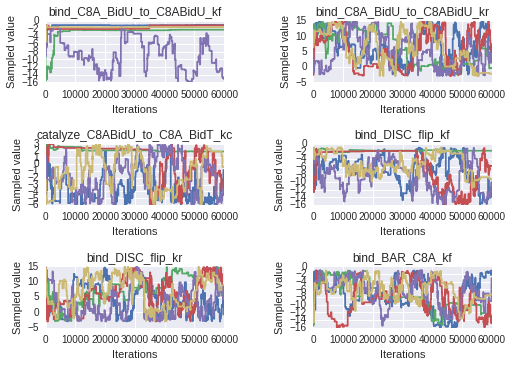

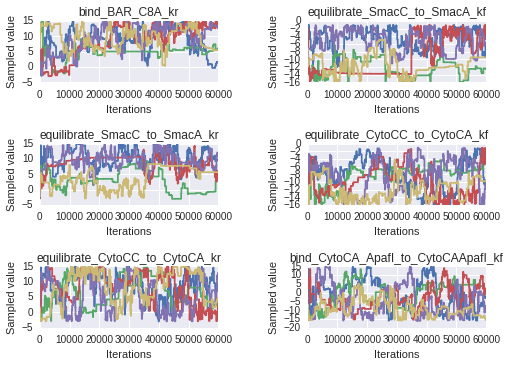

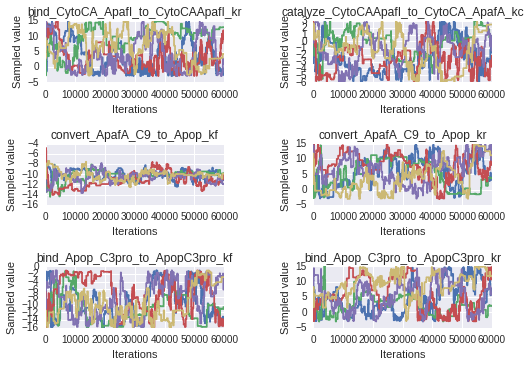

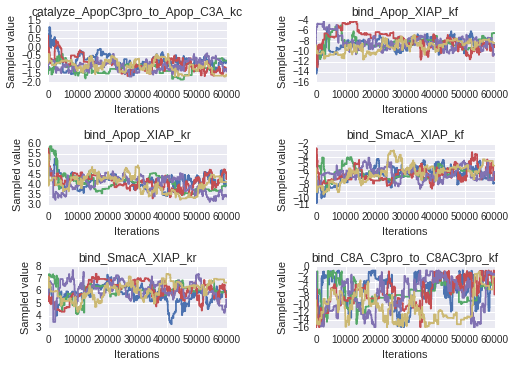

...

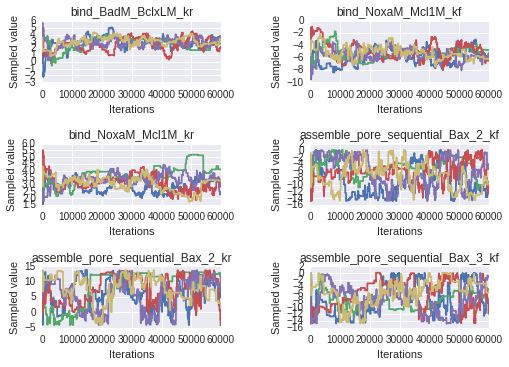

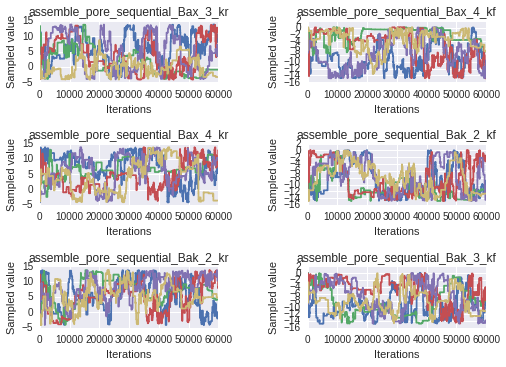

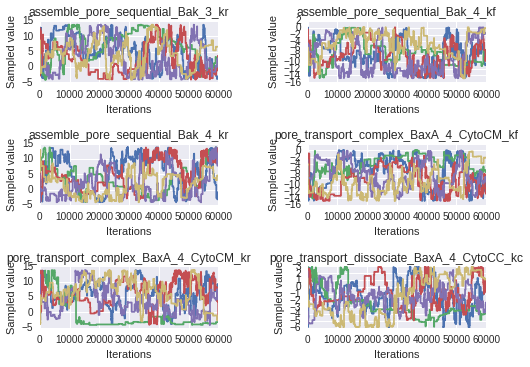

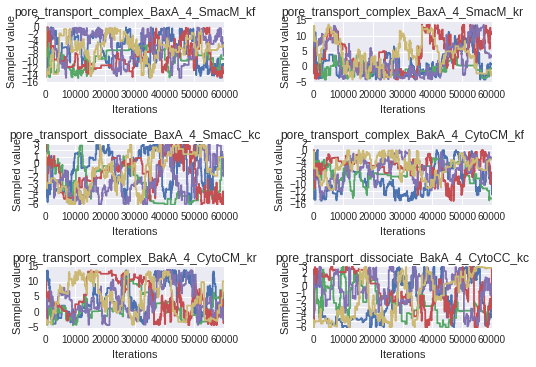

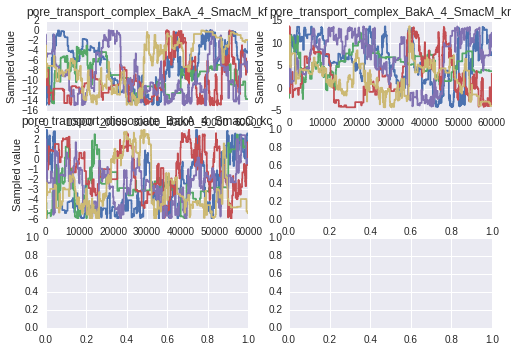

In [ ]:
sample_plots(param_trace_dicts['a'])

In [ ]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=30000)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=30000)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=30000)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=30000)

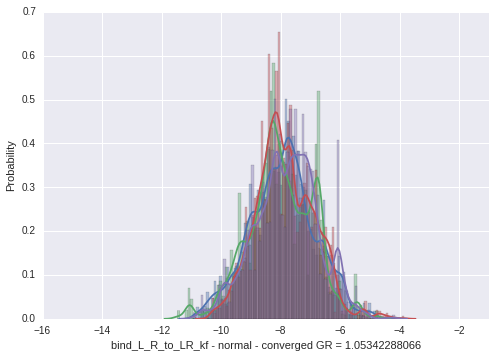

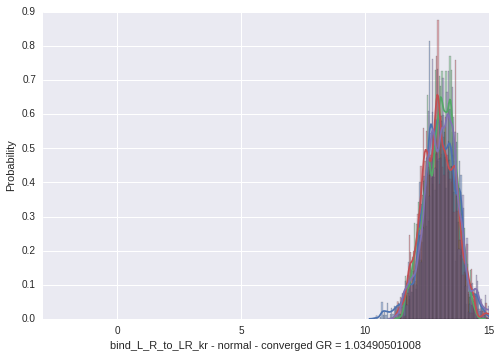

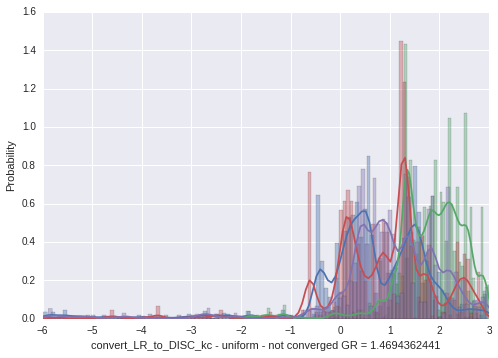

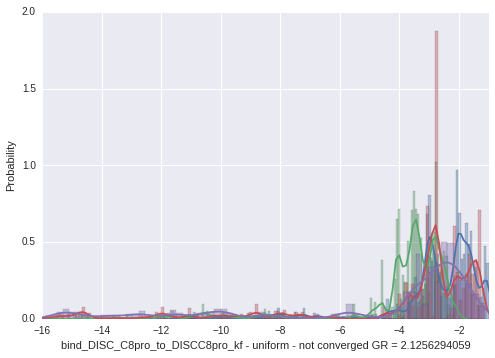

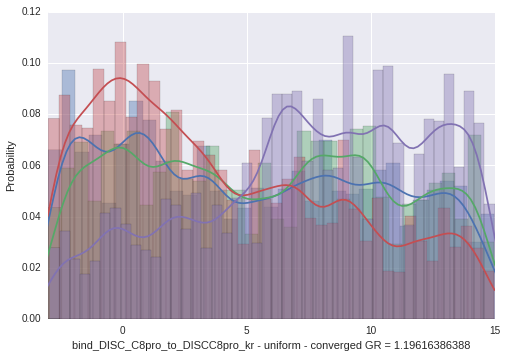

...

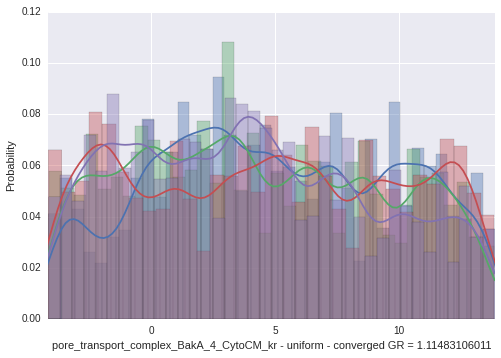

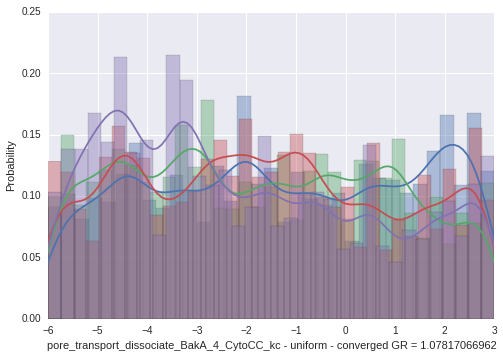

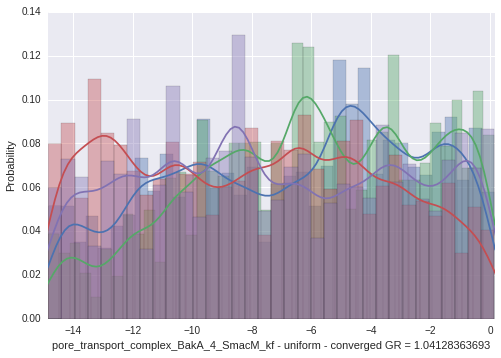

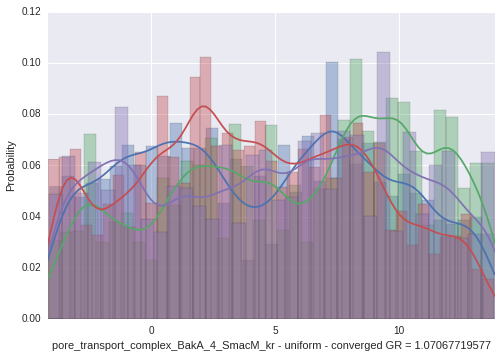

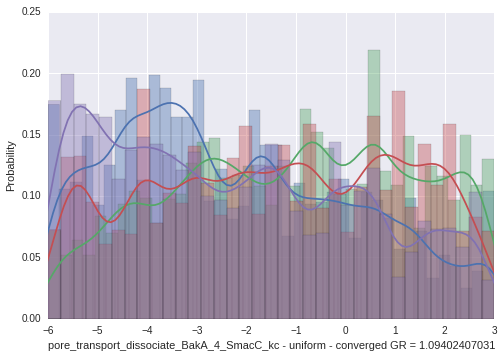

In [97]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True)
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    if earm_rates[param_name]['type'] == 'uniform':
        ax.set_xlim([earm_rates[param_name]['lower'], earm_rates[param_name]['upper']])
    elif 'kf' in param_name:
        ax.set_xlim([-16, -1])
    elif 'kr' in param_name:
        ax.set_xlim([-3, 15])
    elif 'kc' in param_name:
        ax.set_xlim([-6, 3])

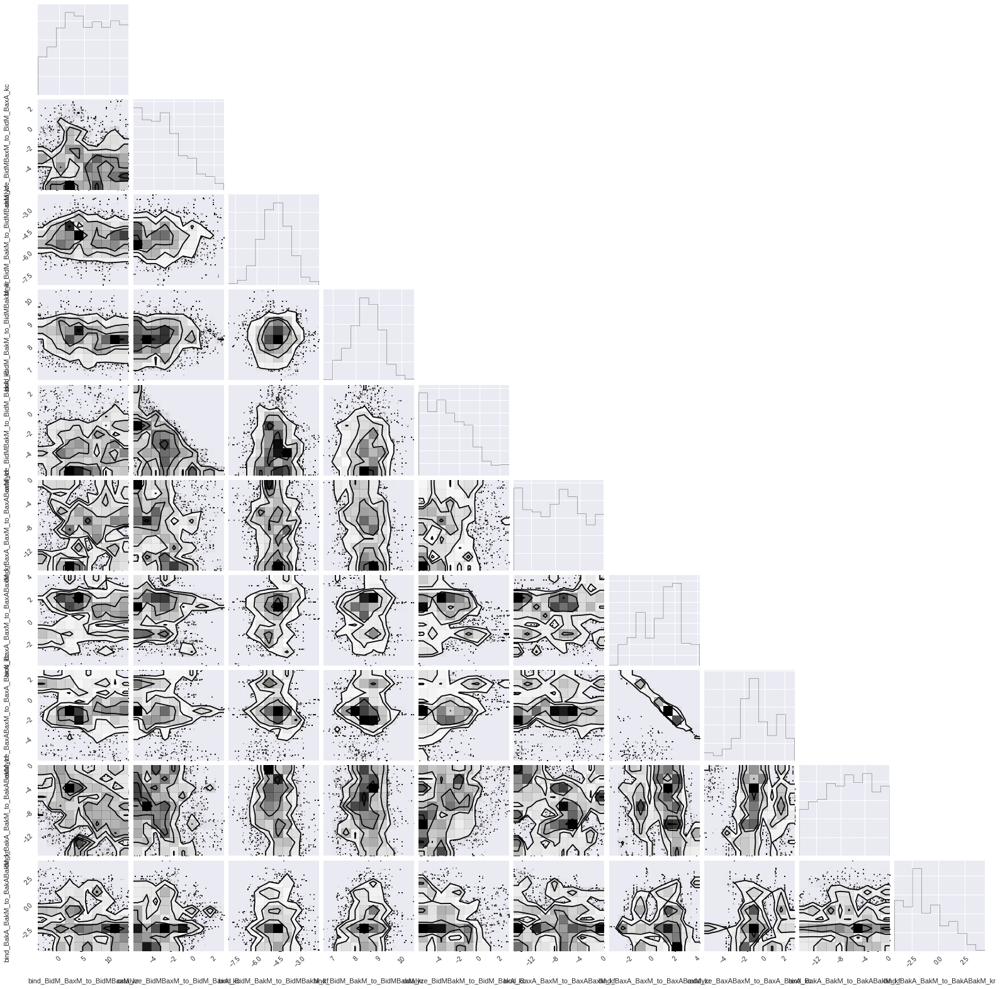

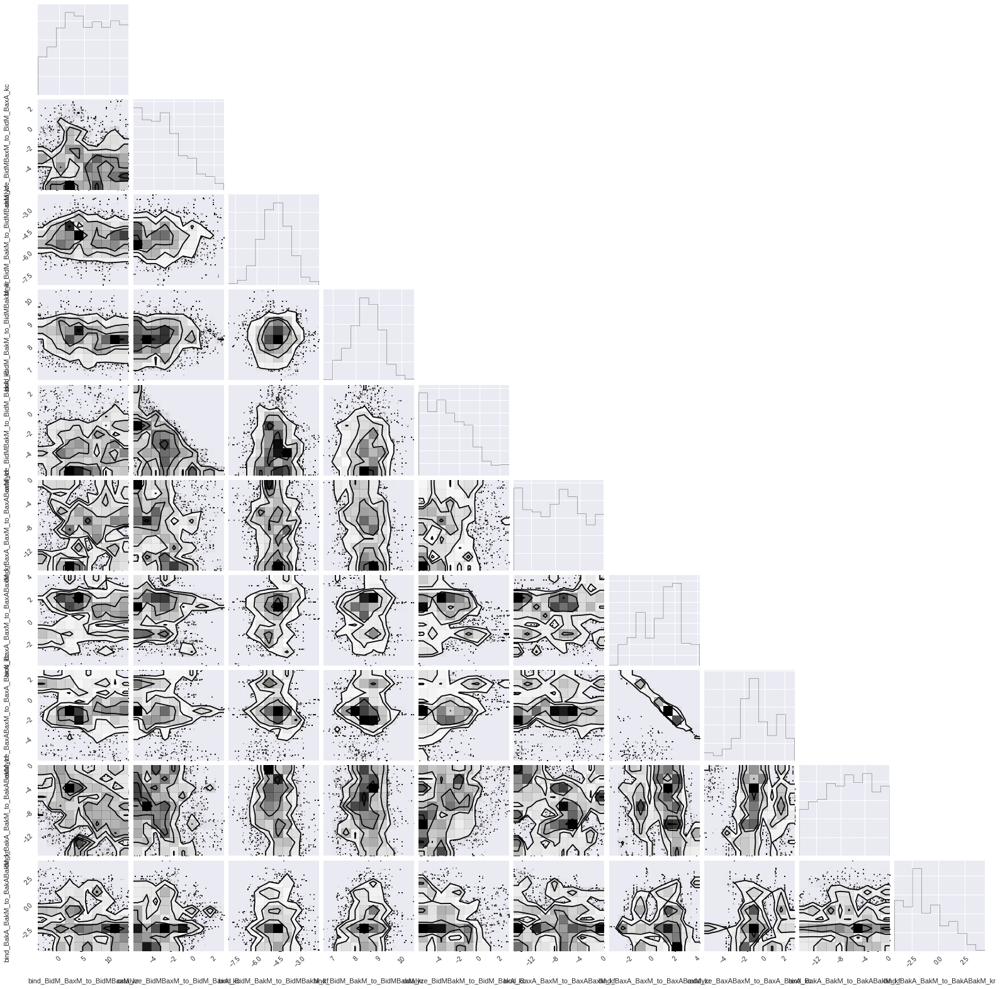

In [99]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)